**Turismo de los Alpes**


El Ministerio de Comercio, Industria y Turismo de Colombia, la Asociación Hotelera y Turística de Colombia – COTELCO, cadenas hoteleras de la talla de Hilton, Hoteles Estelar, Holiday Inn y hoteles pequeños ubicados en diferentes municipios de Colombia están interesados en analizar las características de sitios turísticos que los hacen atractivos para
turistas locales o de otros países, ya sea para ir a conocerlos o recomendarlos. De igual manera, quieren comparar las características de dichos sitios, con aquellos que han obtenido bajas recomendaciones y que están afectando el número de turistas que llegan a ellos. Adicionalmente, quieren tener un mecanismo para determinar la calificación que tendrá un sitio por parte de los turistas y así, por ejemplo, aplicar estrategias para identificar oportunidades de mejora que permitan aumentar la popularidad de los sitios y fomentar el turismo.

Esos actores de turismo prepararon dos conjuntos de datos con reseñas de sitios turísticos. Cada reseña tiene una calificación según el sentimiento que tuvo el turista al visitarlo. Estos actores quieren lograr un análisis independiente de los conjuntos de datos y al final del proyecto discutir sobre los grupos de científicos de datos e ingenieros de datos que acompañarán el desarrollo real de este proyecto.

## **0. Importación de Librerías.**

Para el desarrollo en Google Colab, y poder ejecutar la librería de Pandas-Profiling, debemos ejecutar el siguiente código.


In [1]:
!pip install ydata-profiling
!pip install contractions
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    |   Package bcp47 is already up-to-dat

True

In [2]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import re, string, unicodedata
import contractions
import inflect
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer, WordNetLemmatizer

#Analisis profundo de datos
from ydata_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


# Librería para la creación de nube de etiquetas -Wordcloud.
from wordcloud import WordCloud, STOPWORDS


## **1. Entendimiento del Negocio**

El contexto que nos han dado los expertos ha sido el siguiente:

Las reseñas obtenidas han sido clasificadas bajo las siguientes categorias del 1 al 5; esta escala nos indica el sentimiento que tuvo el turista después de visitar un hotel.

## **2. Entendimiento de los Datos**

Luego de entender el negocio y su objetivo, vamos a realizar la exploración de datos. Así que, leeremos los datos.

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/sofiapapadron/Inteligencia-de-Negocios/main/Proyecto1/tipo2_entrenamiento_estudiantes.csv ')
data.head()

,Review,Class
0,Muy buena atención y aclaración de dudas por p...,5
1,Buen hotel si están obligados a estar cerca de...,3
2,"Es un lugar muy lindo para fotografías, visite...",5
3,Abusados con la factura de alimentos siempre s...,3
4,Tuvimos un par de personas en el grupo que rea...,3


Utilizaremos la libreria de `pandas-profiling` para realizar una exploración de datos más profunda

In [4]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
data= data.drop_duplicates(subset=['Review'])

In [6]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Primero necesitaremos dividir nuestros datos en datos de entrenamiento (train) y datos de evaluación (test).

In [7]:
train, test = train_test_split(data, test_size=0.2, random_state=42)
train.head()

,Review,Class
4191,"El trato es maravilloso, y la comida (sobre to...",5
2327,Una excelente sorpresa en el centro de la zona...,5
7506,La relacion que hay entre precio y calidad no ...,2
905,VAle la pena el espectáculo. El costo con cena...,5
1448,Sus actividades son incribles para disfrutar e...,5


In [8]:
def mostrar_grafico(palabras,stopwords=[]):
    comment_words = ''

    # iterate through the csv file
    for val in palabras:

        # typecaste each val to string
        val = str(val)

        # split the value
        tokens = val.split()

        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()

        comment_words += " ".join(tokens)+" "

    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stopwords,
                    min_font_size = 10).generate(comment_words)

    # plot the WordCloud image
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)

    plt.show()

Y realizamos un `WordCloud`, el cuál nos permitirá realizar un análisis de las palabras más recurrentes dentro de cada una de las categorias.

---------- Words for class: 5 ----------


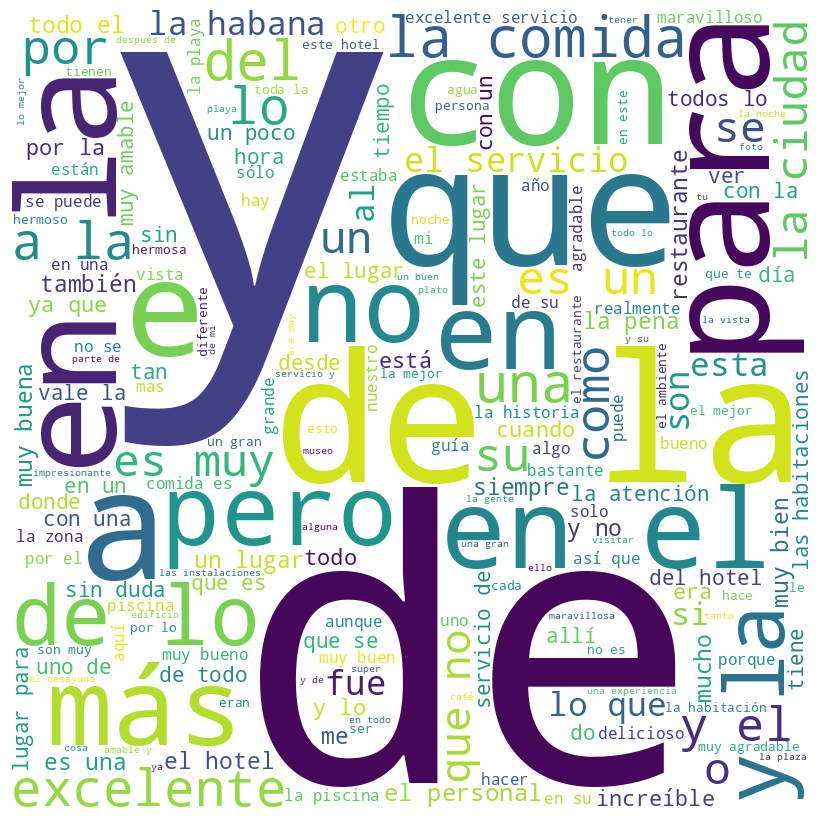

---------- Words for class: 2 ----------


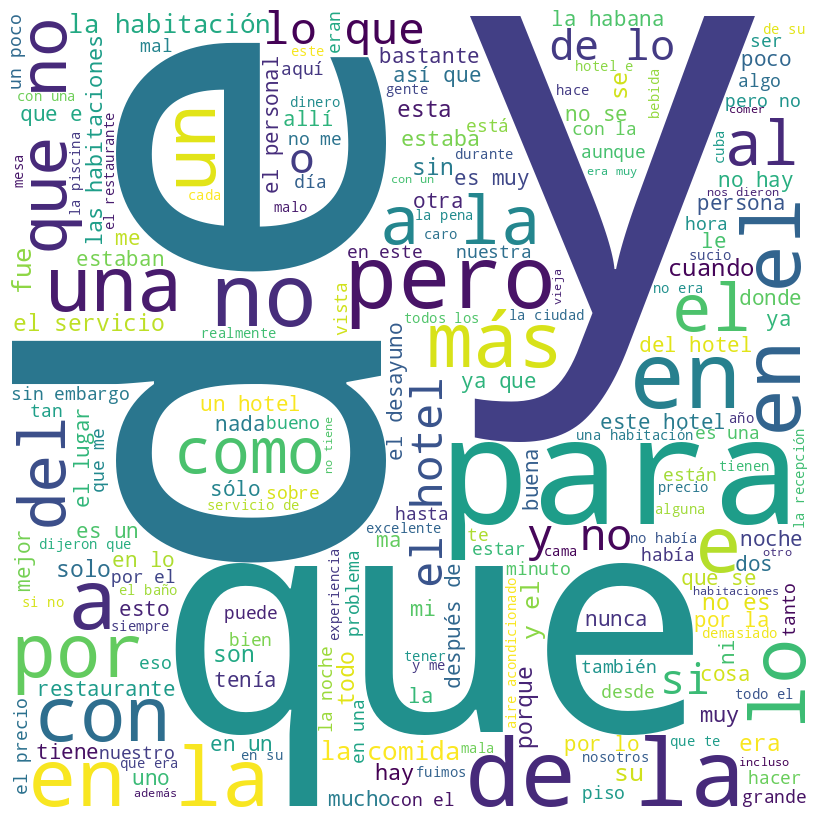

---------- Words for class: 4 ----------


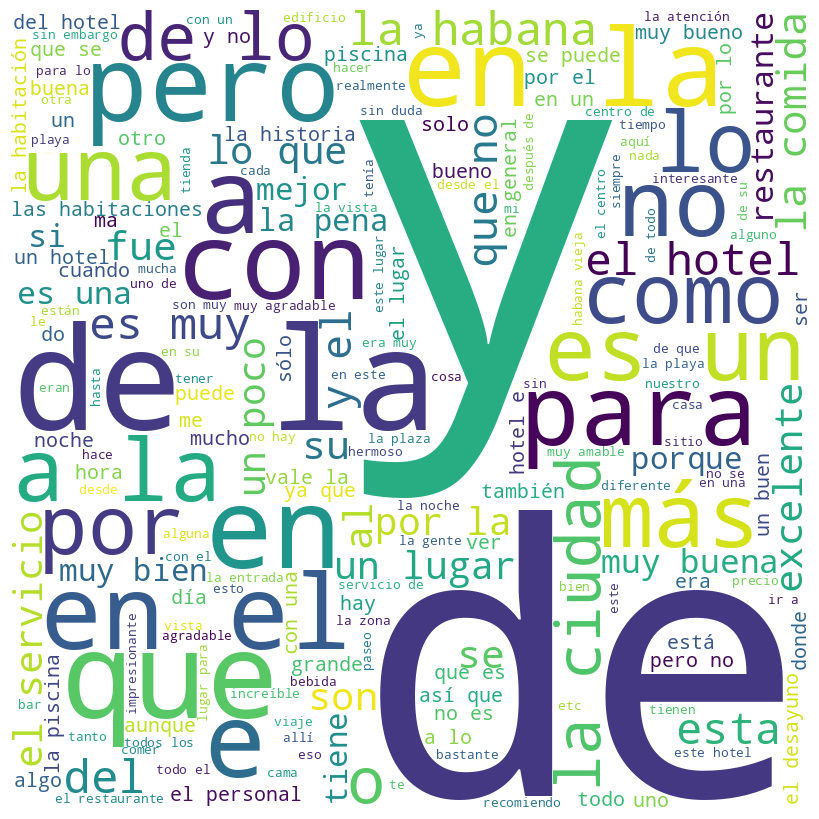

---------- Words for class: 3 ----------


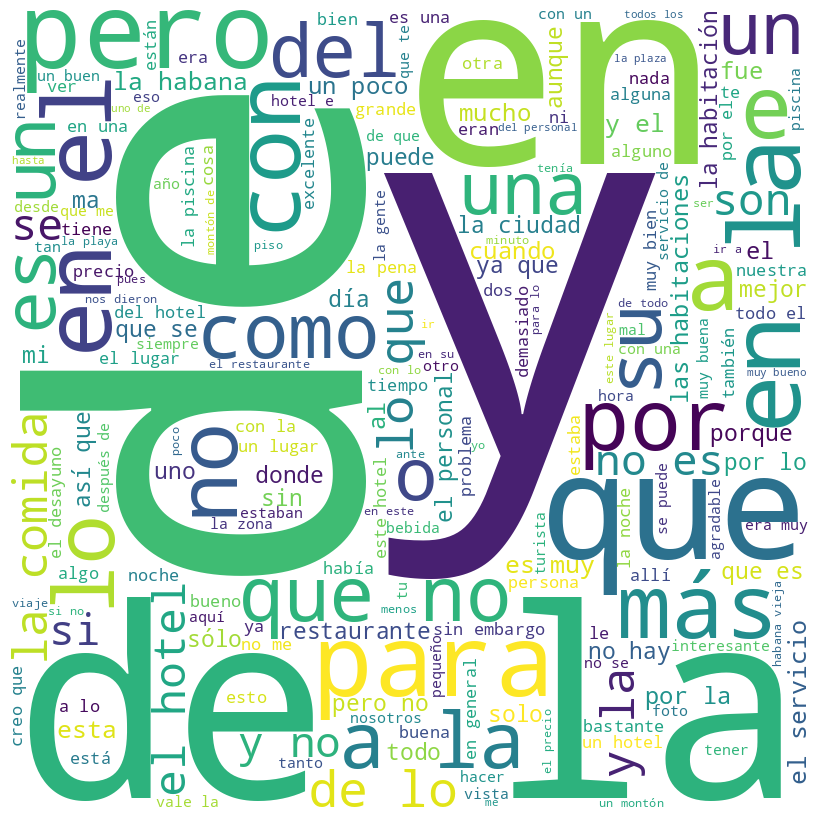

---------- Words for class: 1 ----------


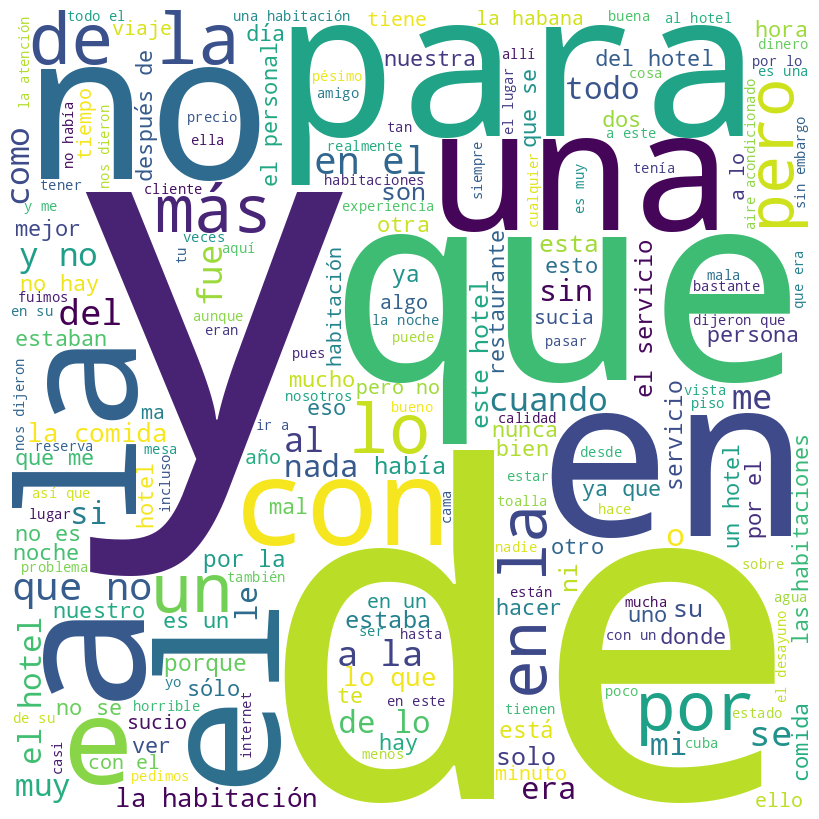

In [9]:
for i in train['Class'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['Class']==i,'Review'])

---------- Words for class: 4 ----------


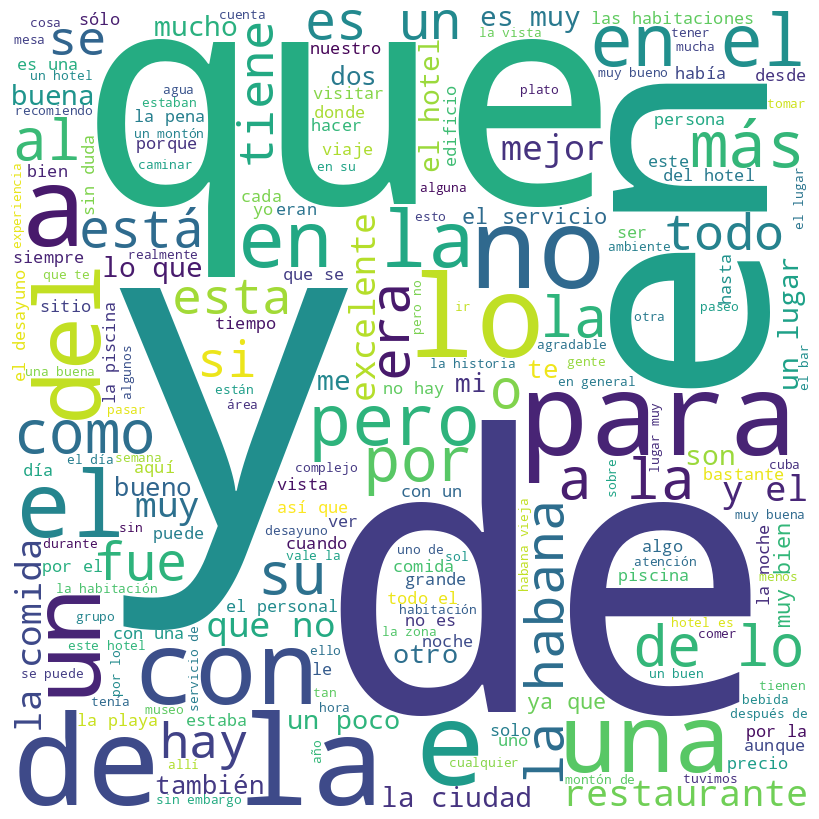

---------- Words for class: 5 ----------


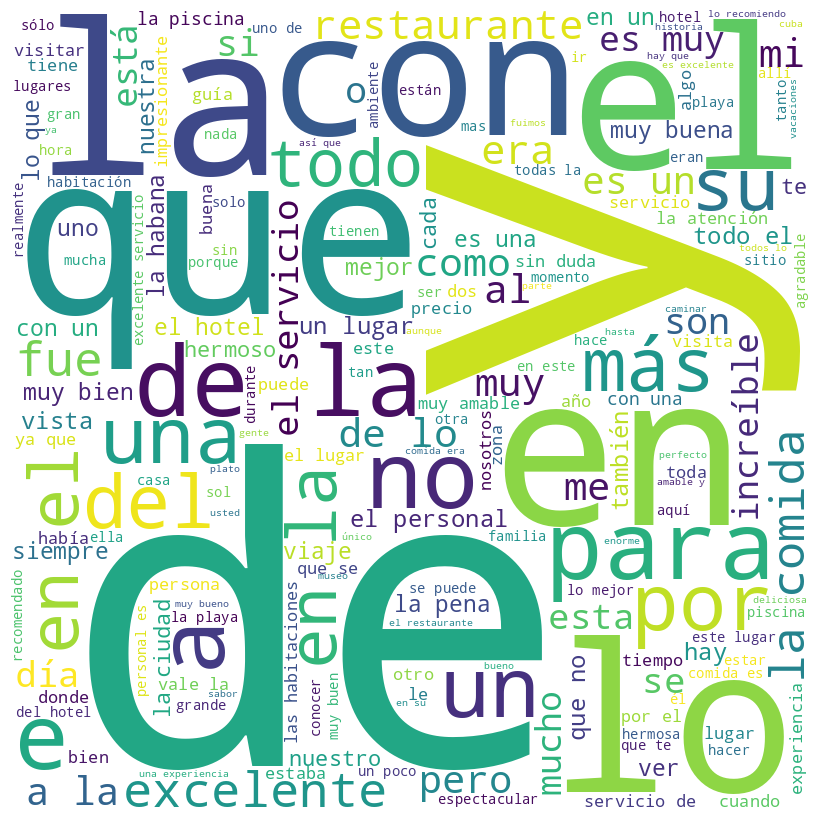

---------- Words for class: 2 ----------


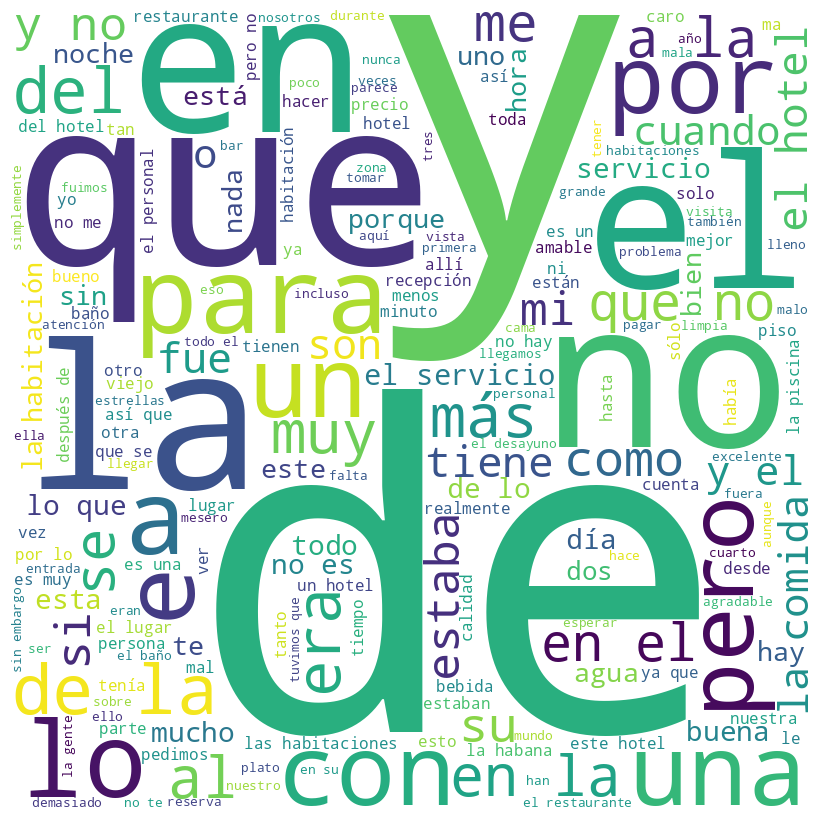

---------- Words for class: 3 ----------


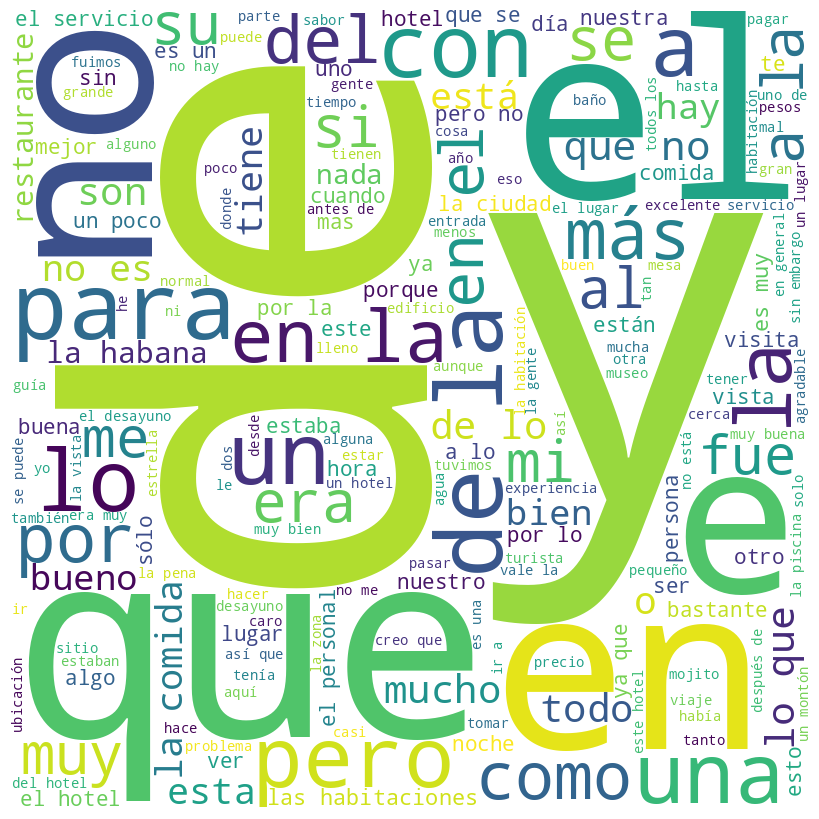

---------- Words for class: 1 ----------


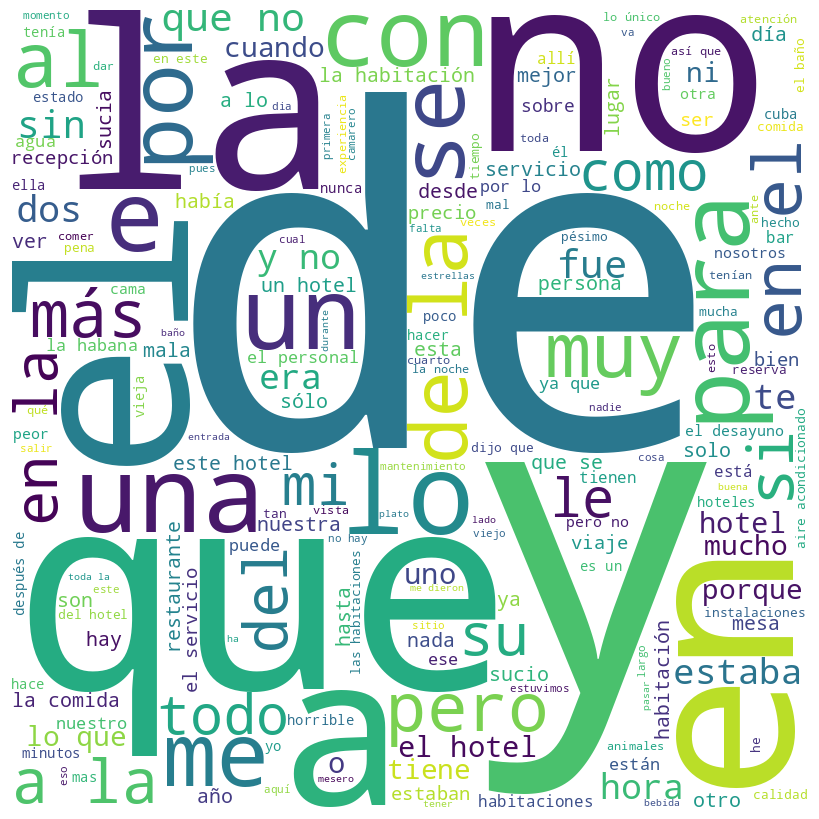

In [10]:
for i in test['Class'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(test.loc[test['Class']==i,'Review'])

Como se puede observar, hay varias palabras frecuentes que no aportan mucha información, esas palabras las llamamos `stopwords`. Existen librerias que han construido esta lista en los diferentes idiomas, así que utilizaremos las palabras vacías en español.

---------- Words for class: 5 ----------


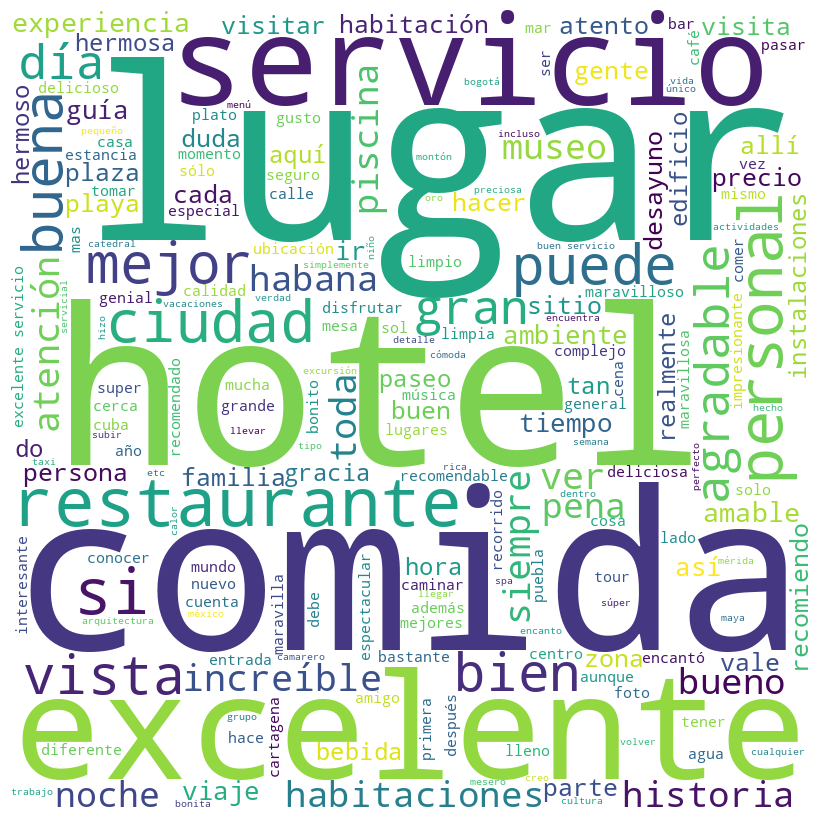

---------- Words for class: 2 ----------


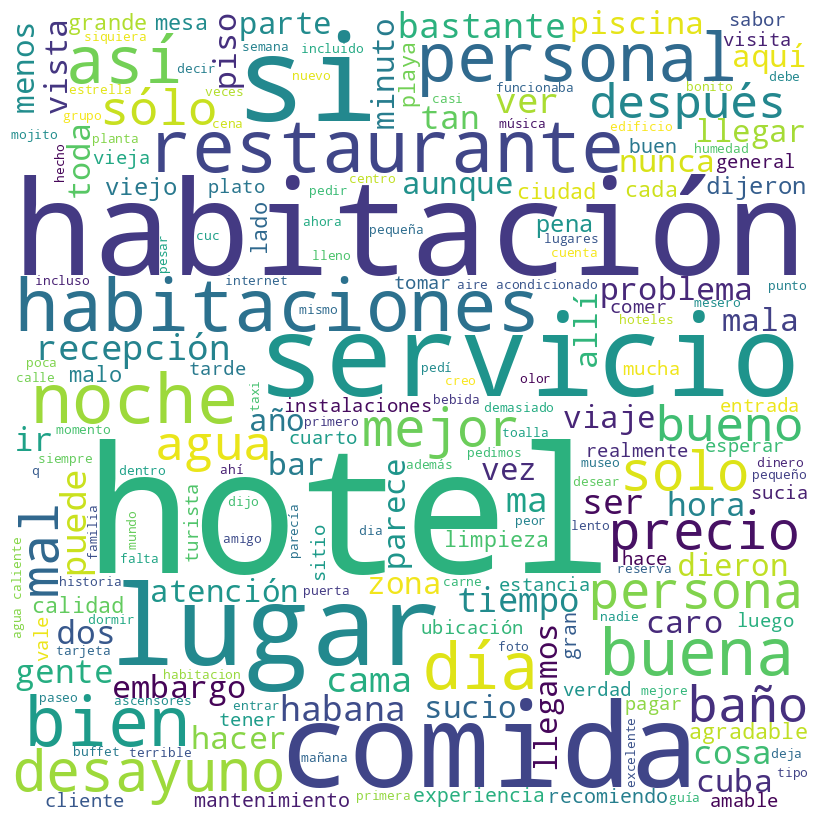

---------- Words for class: 4 ----------


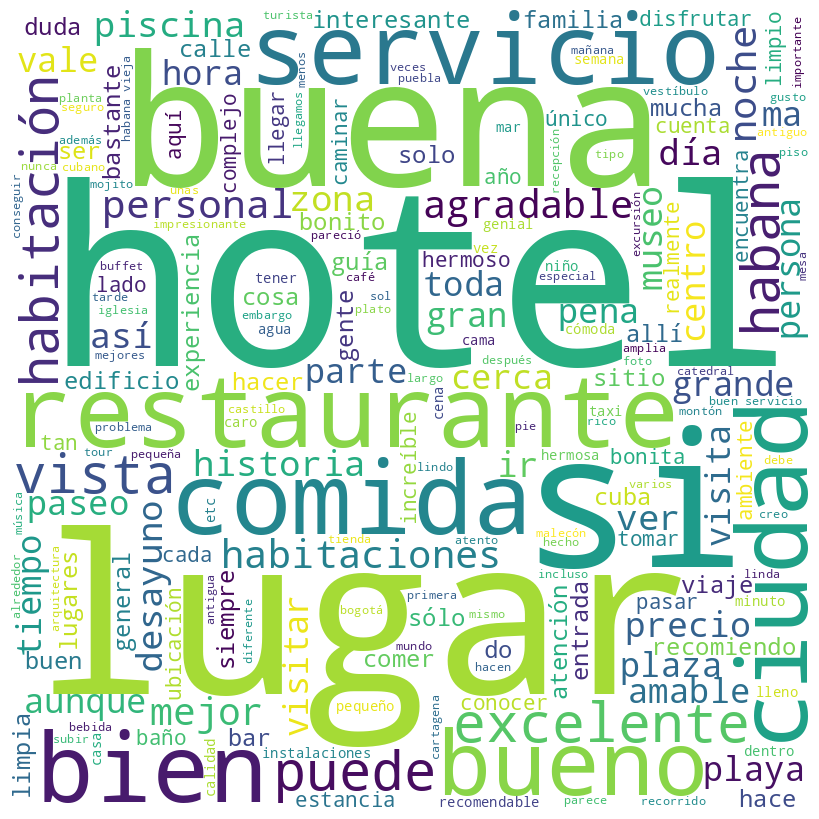

---------- Words for class: 3 ----------


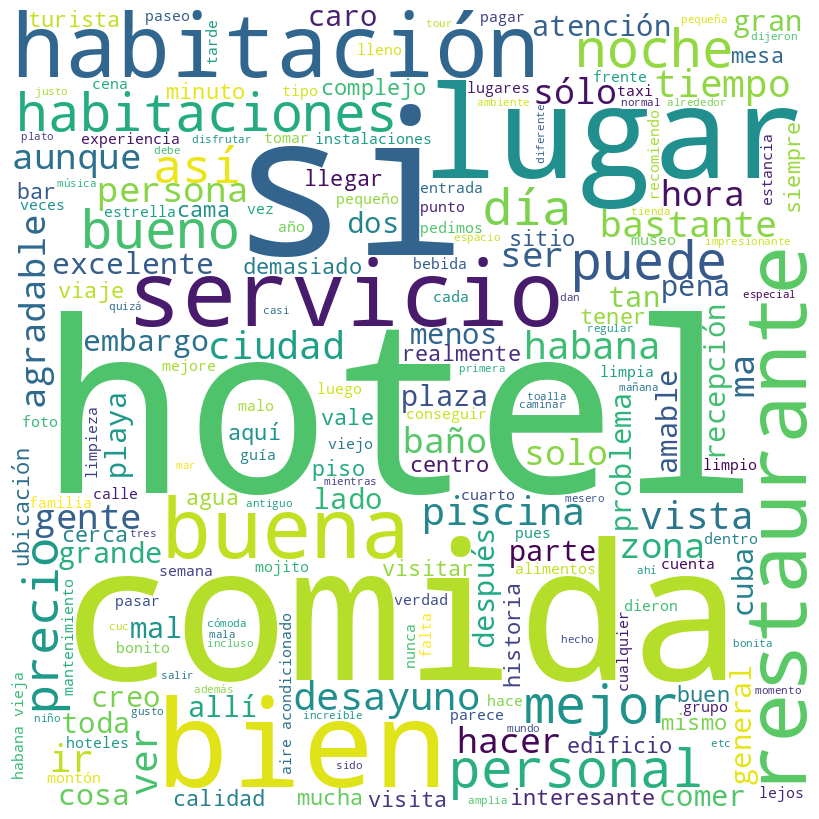

---------- Words for class: 1 ----------


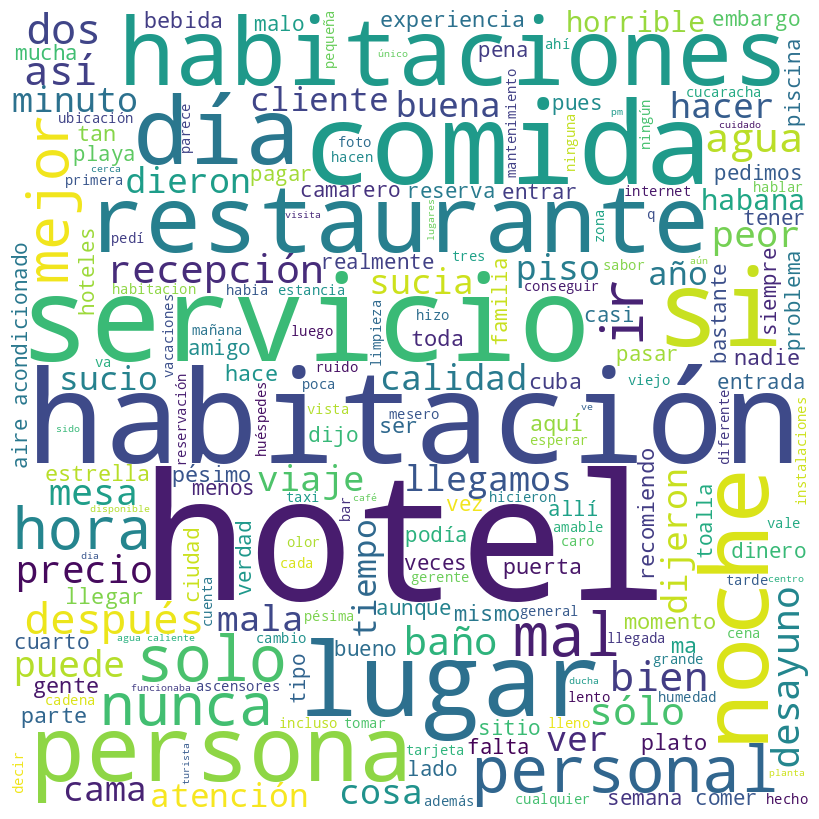

In [11]:
stop_words = stopwords.words('spanish')

for i in train['Class'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(train.loc[train['Class']==i,'Review'], stopwords=stop_words)

---------- Words for class: 4 ----------


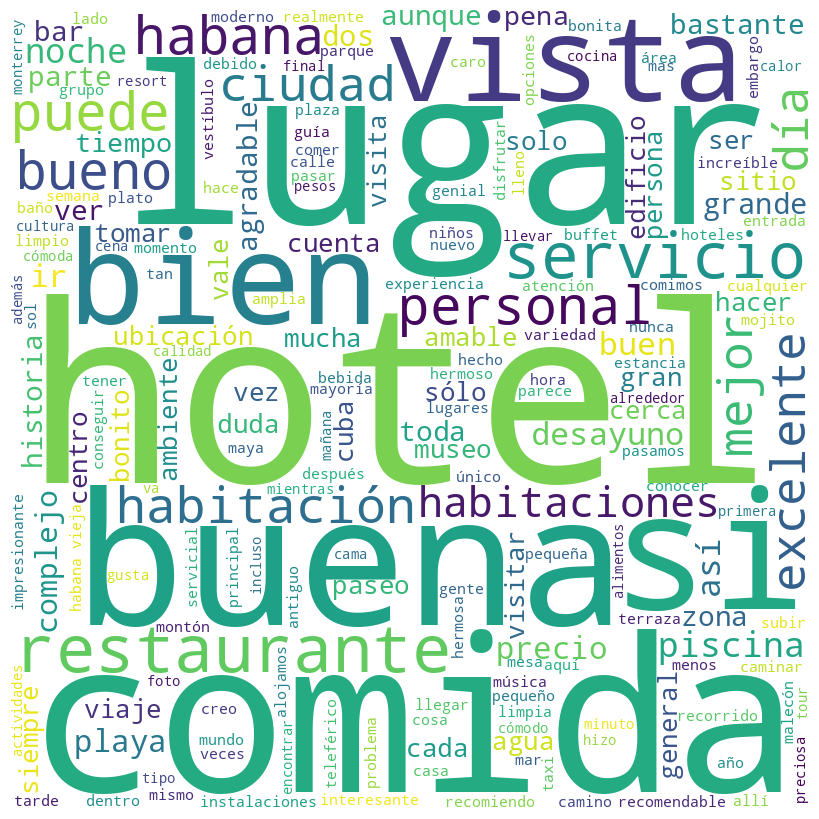

---------- Words for class: 5 ----------


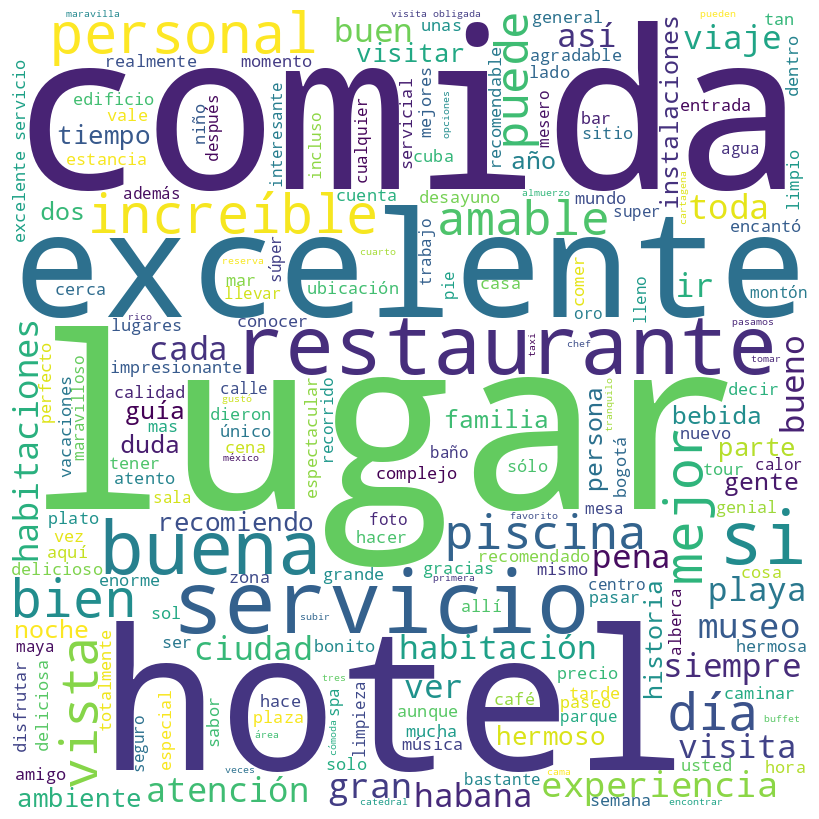

---------- Words for class: 2 ----------


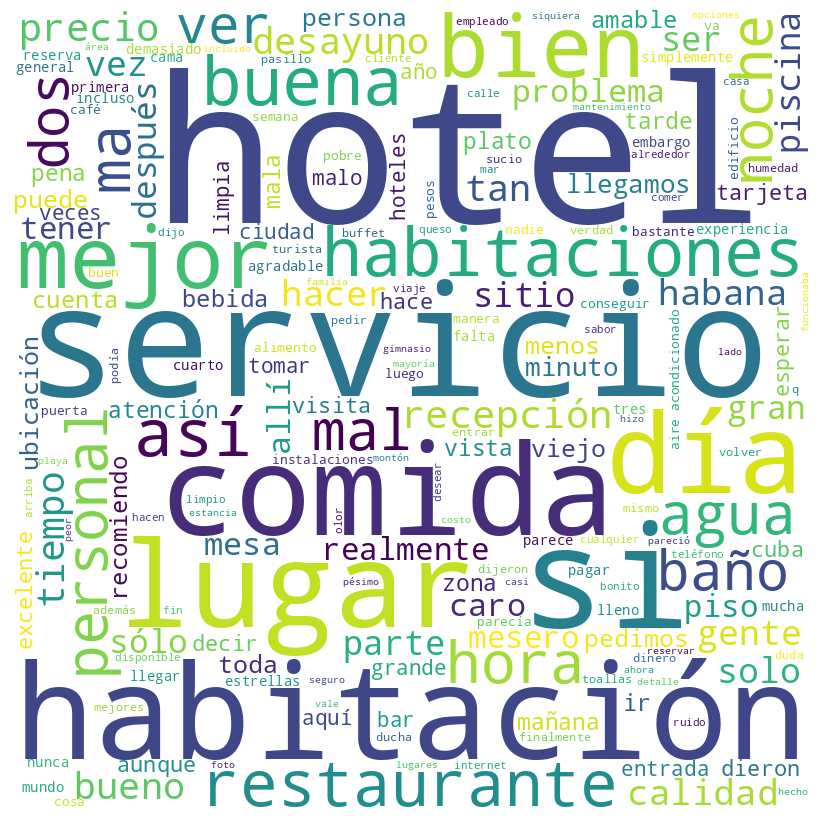

---------- Words for class: 3 ----------


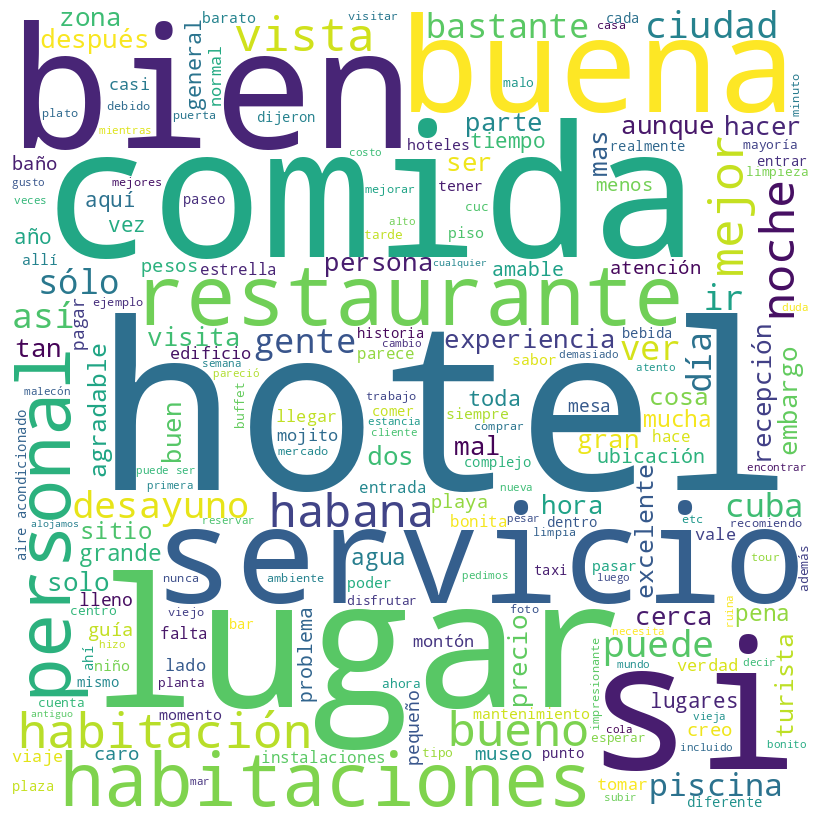

---------- Words for class: 1 ----------


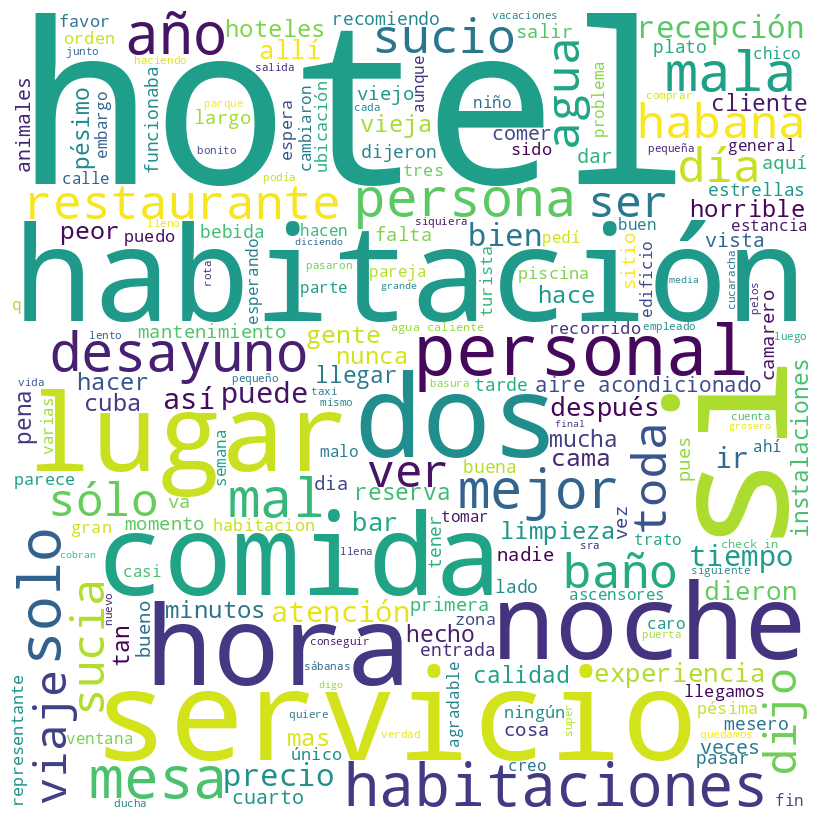

In [12]:
stop_words = stopwords.words('spanish')

for i in test['Class'].unique():
    print(f'---------- Words for class: {i} ----------')
    mostrar_grafico(test.loc[test['Class']==i,'Review'], stopwords=stop_words)

## **3. Preparación de los datos**

Primero dividiremos el texto de la categoría a la que pertenece, para poder realizar un análisis por categoría.

In [13]:
X_train, y_train = train['Review'], train['Class']
display(X_train)
y_train

4191    El trato es maravilloso, y la comida (sobre to...
2327    Una excelente sorpresa en el centro de la zona...
7506    La relacion que hay entre precio y calidad no ...
905     VAle la pena el espectáculo. El costo con cena...
1448    Sus actividades son incribles para disfrutar e...
                              ...                        
5266    La ciudad amurallada fue sin duda lo mejor del...
5435    Nos fuimos hasta Chichen en nuestro coche de a...
861     Un hotel con amplio lobby, grandes piscinas, e...
7676    Pasamos 3 dias en el hotel melia, cohiba en la...
7341    Esta es una gran vista de Bogotá. Recomiendo e...
Name: Review, Length: 6241, dtype: object

4191    5
2327    5
7506    2
905     5
1448    5
       ..
5266    5
5435    5
861     3
7676    3
7341    4
Name: Class, Length: 6241, dtype: int64

In [14]:
X_test, y_test = test['Review'], test['Class']
display(X_test)
y_test

2122    Fascinante viaje atrás en el tiempo con Henequ...
2088    Una estancia en un hotel maravilloso! El perso...
1080    Excelente hotel, muy buena ubicación, frente a...
5441    Algunas de las cosas Malas (no van más por lím...
101     El Cerro de Monserrate es un lugar con una vis...
                              ...                        
5023    Es un lugar que es hermoso para caminar siempr...
2697    Pésimo servicio, ingresamos al lugar a degusta...
4293    Excelentes instalaciones bellas habitaciones b...
5968    En mi opinión, es un lugar que hay que ir por ...
4639    Es un lugar que debes visitar mientras estás e...
Name: Review, Length: 1561, dtype: object

2122    4
2088    4
1080    5
5441    2
101     5
       ..
5023    5
2697    1
4293    4
5968    3
4639    5
Name: Class, Length: 1561, dtype: int64

Para poder realizar el pre-procesamiento de los datos, es recomendable pasar por tres etapas:
* Eliminación del Ruido.
* Tokenización.
* Normalización.

#### **3.1 Eliminación del Ruido**
La eliminación del ruido se utiliza para dejar el archivo en texto plano, sobre todo cuando vienen de diferentes fuentes como HTML, Twitter, XML, entre otros. También para eliminar caracteres especiales y pasar todo a minúscula.

In [15]:
def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

def remove_punctuation(words):
    """Remove punctuation from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = re.sub(r'[^\w\s]', '', word)
        if new_word != '':
            new_words.append(new_word)
    return new_words

def replace_numbers(words):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words

def remove_stopwords(words, stopwords=stopwords.words('spanish')):
    """Remove stop words from list of tokenized words"""
    new_words = []
    for word in words:
        if word not in stopwords:
            new_words.append(word)
    return new_words

def preproccesing(words):
    words = to_lowercase(words)
    #words = replace_numbers(words)
    words = remove_punctuation(words)
    words = remove_non_ascii(words)
    words = remove_stopwords(words)
    return words


#### **3.2 Tokenización**
La tokenización permite dividir frases u oraciones en palabras. Con el fin de desglozar las palabras correctamente para el posterior análisis. Pero primero, se realiza una corrección de las contracciones que pueden estar presentes en los textos.

In [16]:
new_X_train = X_train.apply(word_tokenize)
new_X_train = new_X_train.apply(preproccesing) #Aplica la eliminación del ruido
new_X_train.head()

4191    [trato, maravilloso, comida, mariscos, especia...
2327    [excelente, sorpresa, centro, zona, gastronomi...
7506    [relacion, precio, calidad, cohoerente, alimen...
905     [vale, pena, espectaculo, costo, cena, alto, c...
1448    [actividades, incribles, disfrutar, familia, s...
Name: Review, dtype: object

In [17]:
new_X_test = X_test.apply(word_tokenize)
new_X_test = new_X_test.apply(preproccesing) #Aplica la eliminación del ruido
new_X_test.head()

2122    [fascinante, viaje, atras, tiempo, henequin, p...
2088    [estancia, hotel, maravilloso, personal, amabl...
1080    [excelente, hotel, buena, ubicacion, frente, p...
5441    [cosas, malas, van, mas, limite, espacio, tal,...
101     [cerro, monserrate, lugar, vista, preciosa, cu...
Name: Review, dtype: object

#### **3.3 Normalización**
Para la normalización de los datos se realiza una eliminación de prefijos y sufijos, además de realizar una lemmatización de los verbos.

In [18]:
def stem_words(words):
    """Stem words in list of tokenized words"""
    stemmer = SnowballStemmer('spanish')
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems

def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

def stem_and_lemmatize(words):
    words = stem_words(words)
    words = lemmatize_verbs(words)
    return words

new_X_train = new_X_train.apply(stem_and_lemmatize) #Aplica lematización y Eliminación de Prefijos y Sufijos.
new_X_train.head()

4191    [trat, maravill, com, marisc, especial, oasis,...
2327    [excelent, sorpres, centr, zon, gastronom, bog...
7506    [relacion, preci, calid, cohoerent, aliment, b...
905     [val, pen, espectacul, cost, cen, alto, cen, m...
1448    [activ, incribl, disfrut, famili, sup, divert,...
Name: Review, dtype: object

In [19]:
def stem_words(words):
    """Stem words in list of tokenized words"""
    stemmer = SnowballStemmer('spanish')
    stems = []
    for word in words:
        stem = stemmer.stem(word)
        stems.append(stem)
    return stems

def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

def stem_and_lemmatize(words):
    words = stem_words(words)
    words = lemmatize_verbs(words)
    return words

new_X_test = new_X_test.apply(stem_and_lemmatize) #Aplica lematización y Eliminación de Prefijos y Sufijos.
new_X_test.head()

2122    [fascin, viaj, atras, tiemp, henequin, producc...
2088    [estanci, hotel, maravill, personal, amabl, de...
1080    [excelent, hotel, buen, ubic, frent, parqu, ce...
5441    [cos, mal, van, mas, limit, espaci, tal, vez, ...
101     [cerr, monserrat, lug, vist, precios, cuid, bo...
Name: Review, dtype: object

#### **3.4 Transformación de campos**

In [20]:
train['trans'] = new_X_train.apply(lambda x: ' '.join(map(str, x)))
train

,Review,Class,trans
4191,"El trato es maravilloso, y la comida (sobre to...",5,trat maravill com marisc especial oasis medi c...
2327,Una excelente sorpresa en el centro de la zona...,5,excelent sorpres centr zon gastronom bogot ava...
7506,La relacion que hay entre precio y calidad no ...,2,relacion preci calid cohoerent aliment buffet ...
905,VAle la pena el espectáculo. El costo con cena...,5,val pen espectacul cost cen alto cen mund val ...
1448,Sus actividades son incribles para disfrutar e...,5,activ incribl disfrut famili sup divert gran s...
...,...,...,...
5266,La ciudad amurallada fue sin duda lo mejor del...,5,ciud amurall dud mejor viaj llen fantast resta...
5435,Nos fuimos hasta Chichen en nuestro coche de a...,5,chich coch alquil lleg alli despu abries elecc...
861,"Un hotel con amplio lobby, grandes piscinas, e...",3,hotel ampli lobby grand piscin enorm habit gra...
7676,"Pasamos 3 dias en el hotel melia, cohiba en la...",3,pas 3 dias hotel meli cohib haban atencion equ...


In [21]:
test['trans_test'] = new_X_test.apply(lambda x: ' '.join(map(str, x)))
test

,Review,Class,trans_test
2122,Fascinante viaje atrás en el tiempo con Henequ...,4,fascin viaj atras tiemp henequin produccion si...
2088,Una estancia en un hotel maravilloso! El perso...,4,estanci hotel maravill personal amabl desayun ...
1080,"Excelente hotel, muy buena ubicación, frente a...",5,excelent hotel buen ubic frent parqu central h...
5441,Algunas de las cosas Malas (no van más por lím...,2,cos mal van mas limit espaci tal vez cos mas a...
101,El Cerro de Monserrate es un lugar con una vis...,5,cerr monserrat lug vist precios cuid bogot cli...
...,...,...,...
5023,Es un lugar que es hermoso para caminar siempr...,5,lug hermos camin siempr llen gent alli pued en...
2697,"Pésimo servicio, ingresamos al lugar a degusta...",1,pesim servici ingres lug degust platill his fa...
4293,Excelentes instalaciones bellas habitaciones b...,4,excelent instal bell habit buen air buen limpi...
5968,"En mi opinión, es un lugar que hay que ir por ...",3,opinion lug ir ubic folclor decepcion ofrec ah...


Primero, se transforma el texto con una transformación binaria 1 a 1, en donde a cada carácter se le asigna un valor binario único. Convertir el texto a una representación binaria puede ser útil para realizar operaciones lógicas bit a bit, facilitando la comparación de cadenas, la búsqueda de patrones, o la implementación de algoritmos específicos de manera más eficiente.

In [22]:
dummy = CountVectorizer(binary=True)
X_dummy = dummy.fit_transform(train['trans'])
print(X_dummy.shape)
X_dummy[0]

(6241, 12696)


<1x12696 sparse matrix of type '<class 'numpy.int64'>'
	with 10 stored elements in Compressed Sparse Row format>

In [23]:
dummy_test = CountVectorizer(binary=True)
X_dummy_test = dummy.fit_transform(test['trans_test'])
print(X_dummy_test.shape)
X_dummy_test[0]

(1561, 6345)


<1x6345 sparse matrix of type '<class 'numpy.int64'>'
	with 12 stored elements in Compressed Sparse Row format>

También, se puede realizar el conteo de las palabras presentes.

In [24]:
count = CountVectorizer()
X_count = count.fit_transform(train['trans'])
print(X_count.shape)

(6241, 12696)


In [25]:
count_test = CountVectorizer()
X_count_test = count.fit_transform(test['trans_test'])
print(X_count_test.shape)

(1561, 6345)


O, se puede realizar la transformación Term-frecuency times inverse Document-frecuency. La transformación Term Frequency-Inverse Document Frequency (TF-IDF) es una técnica utilizada en el procesamiento de lenguaje natural (NLP) y la recuperación de información para reflejar la importancia de una palabra dentro de un documento en relación con una colección de documentos o corpus.



In [26]:
tf_idf = TfidfVectorizer()
X_tf_idf = tf_idf.fit_transform(train['trans'])
print(X_tf_idf.shape)

(6241, 12696)


In [27]:
tf_idf_test = TfidfVectorizer()
X_tf_idf_test = tf_idf.fit_transform(test['trans_test'])
print(X_tf_idf_test.shape)

(1561, 6345)


##**4. Modelado**

Primero, utilizaremos nuestro "preparador" de datos, y lo incluiremos en el Pipeline. Para poder realizar la búsqueda de nuestro mejor modelo.

In [28]:
class TextPreprocessing(BaseEstimator,TransformerMixin):
    def __init__(self,stopwords=stopwords.words('spanish')):
        self.stopwords = stopwords

    def remove_non_ascii(self, words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words

    def to_lowercase(self, words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words

    def remove_punctuation(self, words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words

    def replace_numbers(self, words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words

    def remove_stopwords(self, words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in self.stopwords:
                new_words.append(word)
        return new_words

    def stem_words(self, words):
        """Stem words in list of tokenized words"""
        stemmer = SnowballStemmer('spanish')
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems

    def lemmatize_verbs(self, words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas

    def stem_and_lemmatize(self, words):
        words = self.stem_words(words)
        words = self.lemmatize_verbs(words)
        return words

    def preproccesing(self, words):
        words = self.to_lowercase(words)
        words = self.replace_numbers(words)
        words = self.remove_punctuation(words)
        words = self.remove_non_ascii(words)
        words = self.remove_stopwords(words)
        return words

    def fit(self,X,y=None):
        return self

    def transform(self,X,y=None):
        new_X_train = pd.Series(X)
        new_X_train = new_X_train.apply(contractions.fix)
        new_X_train = new_X_train.apply(word_tokenize)
        new_X_train = new_X_train.apply(lambda x: self.preproccesing(x))
        new_X_train = new_X_train.apply(lambda x: self.stem_and_lemmatize(x))
        new_X_train = new_X_train.apply(lambda x: ' '.join(map(str, x)))
        return new_X_train

In [29]:
class TextPreprocessing(BaseEstimator,TransformerMixin):
    def __init__(self,stopwords=stopwords.words('spanish')):
        self.stopwords = stopwords

    def remove_non_ascii(self, words):
        """Remove non-ASCII characters from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
            new_words.append(new_word)
        return new_words

    def to_lowercase(self, words):
        """Convert all characters to lowercase from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = word.lower()
            new_words.append(new_word)
        return new_words

    def remove_punctuation(self, words):
        """Remove punctuation from list of tokenized words"""
        new_words = []
        for word in words:
            new_word = re.sub(r'[^\w\s]', '', word)
            if new_word != '':
                new_words.append(new_word)
        return new_words

    def replace_numbers(self, words):
        """Replace all interger occurrences in list of tokenized words with textual representation"""
        p = inflect.engine()
        new_words = []
        for word in words:
            if word.isdigit():
                new_word = p.number_to_words(word)
                new_words.append(new_word)
            else:
                new_words.append(word)
        return new_words

    def remove_stopwords(self, words):
        """Remove stop words from list of tokenized words"""
        new_words = []
        for word in words:
            if word not in self.stopwords:
                new_words.append(word)
        return new_words

    def stem_words(self, words):
        """Stem words in list of tokenized words"""
        stemmer = SnowballStemmer('spanish')
        stems = []
        for word in words:
            stem = stemmer.stem(word)
            stems.append(stem)
        return stems

    def lemmatize_verbs(self, words):
        """Lemmatize verbs in list of tokenized words"""
        lemmatizer = WordNetLemmatizer()
        lemmas = []
        for word in words:
            lemma = lemmatizer.lemmatize(word, pos='v')
            lemmas.append(lemma)
        return lemmas

    def stem_and_lemmatize(self, words):
        words = self.stem_words(words)
        words = self.lemmatize_verbs(words)
        return words

    def preproccesing(self, words):
        words = self.to_lowercase(words)
        words = self.replace_numbers(words)
        words = self.remove_punctuation(words)
        words = self.remove_non_ascii(words)
        words = self.remove_stopwords(words)
        return words

    def fit(self,X,y=None):
        return self

    def transform(self,X,y=None):
        new_X_test = pd.Series(X)
        new_X_test = new_X_test.apply(contractions.fix)
        new_X_test = new_X_test.apply(word_tokenize)
        new_X_test = new_X_test.apply(lambda x: self.preproccesing(x))
        new_X_test = new_X_test.apply(lambda x: self.stem_and_lemmatize(x))
        new_X_test = new_X_test.apply(lambda x: ' '.join(map(str, x)))
        return new_X_test

###**4.1 SVM**

In [30]:
%%time
estimators = [
        ('preproccess',TextPreprocessing()),
        ('transform',CountVectorizer(lowercase=False)),
        ('classifier', SVC(kernel='linear', probability=True))
    ]

pipe_SVM = Pipeline(estimators)

pipe_SVM.fit(X_train, y_train)

CPU times: user 1min 35s, sys: 153 ms, total: 1min 35s
Wall time: 1min 38s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', SVC(kernel='linear', probability=True))])

In [31]:
y_pred_train_SVM = pipe_SVM.predict(X_train)
y_pred_train_SVM

array([5, 5, 2, ..., 3, 3, 4])

In [32]:
y_pred_test_SVM = pipe_SVM.predict(X_test)
y_pred_test_SVM

array([5, 4, 5, ..., 5, 3, 5])

In [33]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues,size=(10,10)):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')



    fig, ax = plt.subplots(figsize=size)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


Y ya con nuestros clasificadores entrenados, podemos establecer nuestra **Matriz de Confusión**

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

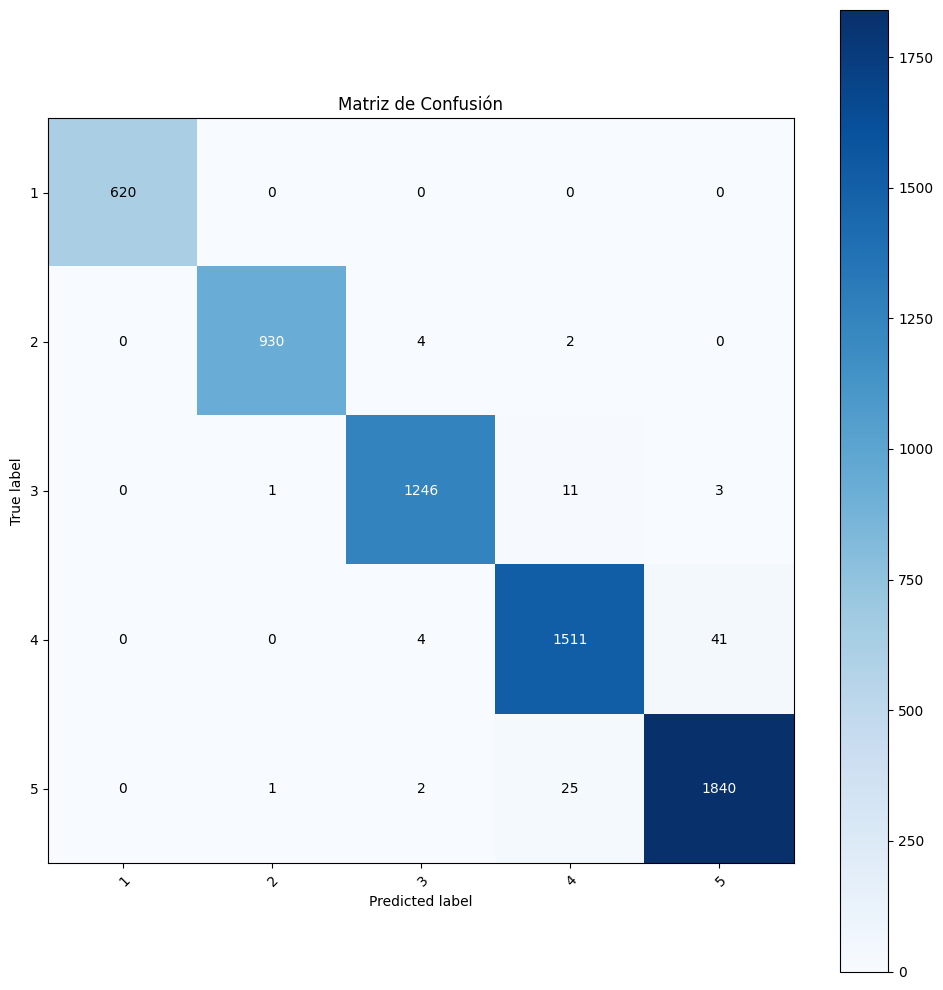

In [34]:
%matplotlib inline

classes = pipe_SVM['classifier'].classes_

plot_confusion_matrix(y_true=y_train, y_pred=y_pred_train_SVM, classes=classes,
                      title='Matriz de Confusión')

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

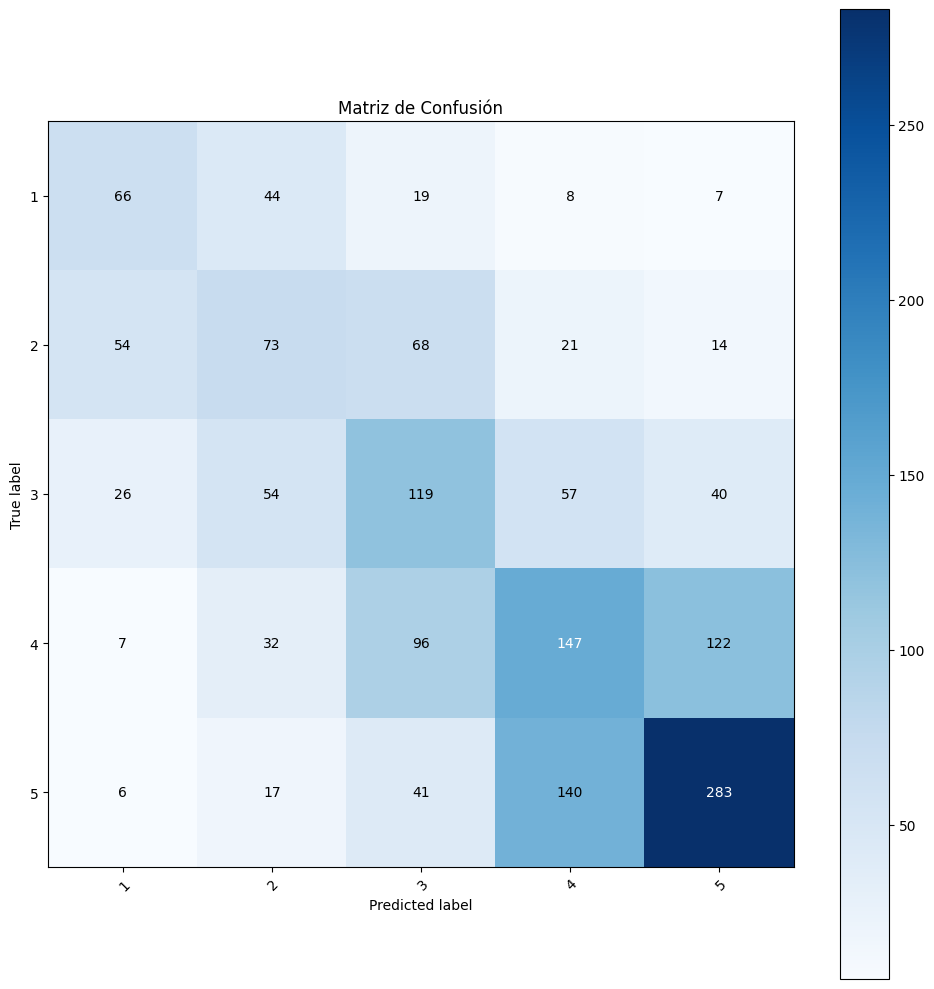

In [35]:
%matplotlib inline

classes = pipe_SVM['classifier'].classes_

plot_confusion_matrix(y_true=y_test, y_pred=y_pred_test_SVM, classes=classes,
                      title='Matriz de Confusión')

In [36]:
report_SVC = classification_report(y_train, y_pred_train_SVM)

print("Train Report for Support Vector Machines\n", report_SVC)

Train Report for Support Vector Machines
               precision    recall  f1-score   support

           1       1.00      1.00      1.00       620
           2       1.00      0.99      1.00       936
           3       0.99      0.99      0.99      1261
           4       0.98      0.97      0.97      1556
           5       0.98      0.99      0.98      1868

    accuracy                           0.98      6241
   macro avg       0.99      0.99      0.99      6241
weighted avg       0.98      0.98      0.98      6241



In [37]:
report_SVC_test = classification_report(y_test, y_pred_test_SVM)

print("Test Report for Support Vector Machines\n", report_SVC_test)

Test Report for Support Vector Machines
               precision    recall  f1-score   support

           1       0.42      0.46      0.44       144
           2       0.33      0.32      0.32       230
           3       0.35      0.40      0.37       296
           4       0.39      0.36      0.38       404
           5       0.61      0.58      0.59       487

    accuracy                           0.44      1561
   macro avg       0.42      0.42      0.42      1561
weighted avg       0.44      0.44      0.44      1561



In [38]:
precision = accuracy_score(y_train, y_pred_train_SVM)

print("Precisión del modelo:", precision)

Precisión del modelo: 0.9849383111680821


In [39]:
precision = accuracy_score(y_test, y_pred_test_SVM)

print("Precisión del modelo con test :", precision)

Precisión del modelo con test : 0.4407431133888533


###**4.2 Naive Bayes**

In [40]:
%%time
estimators = [
        ('preproccess',TextPreprocessing()),
        ('transform',CountVectorizer(lowercase=False)),
        ('classifier', MultinomialNB())
    ]

pipe_NB = Pipeline(estimators)

pipe_NB.fit(X_train, y_train)

CPU times: user 11.9 s, sys: 38.2 ms, total: 12 s
Wall time: 12.1 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', MultinomialNB())])

In [41]:
y_pred_train_NB = pipe_NB.predict(X_train)
y_pred_train_NB

array([5, 5, 2, ..., 3, 4, 4])

In [42]:
y_pred_test_NB = pipe_NB.predict(X_test)
y_pred_test_NB

array([5, 4, 4, ..., 4, 4, 5])

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

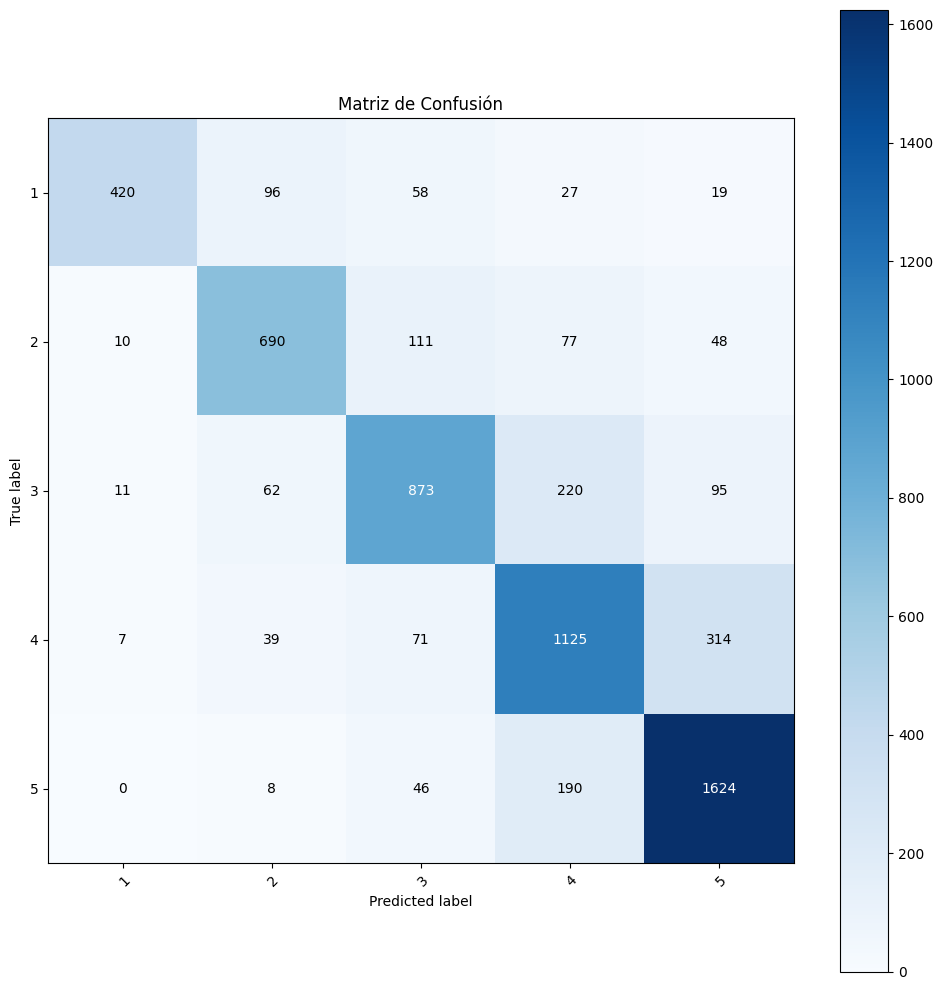

In [43]:
%matplotlib inline

classes = pipe_NB['classifier'].classes_

plot_confusion_matrix(y_true=y_train, y_pred=y_pred_train_NB, classes=classes,
                      title='Matriz de Confusión')

Confusion matrix, without normalization


<Axes: title={'center': 'Matriz de Confusión'}, xlabel='Predicted label', ylabel='True label'>

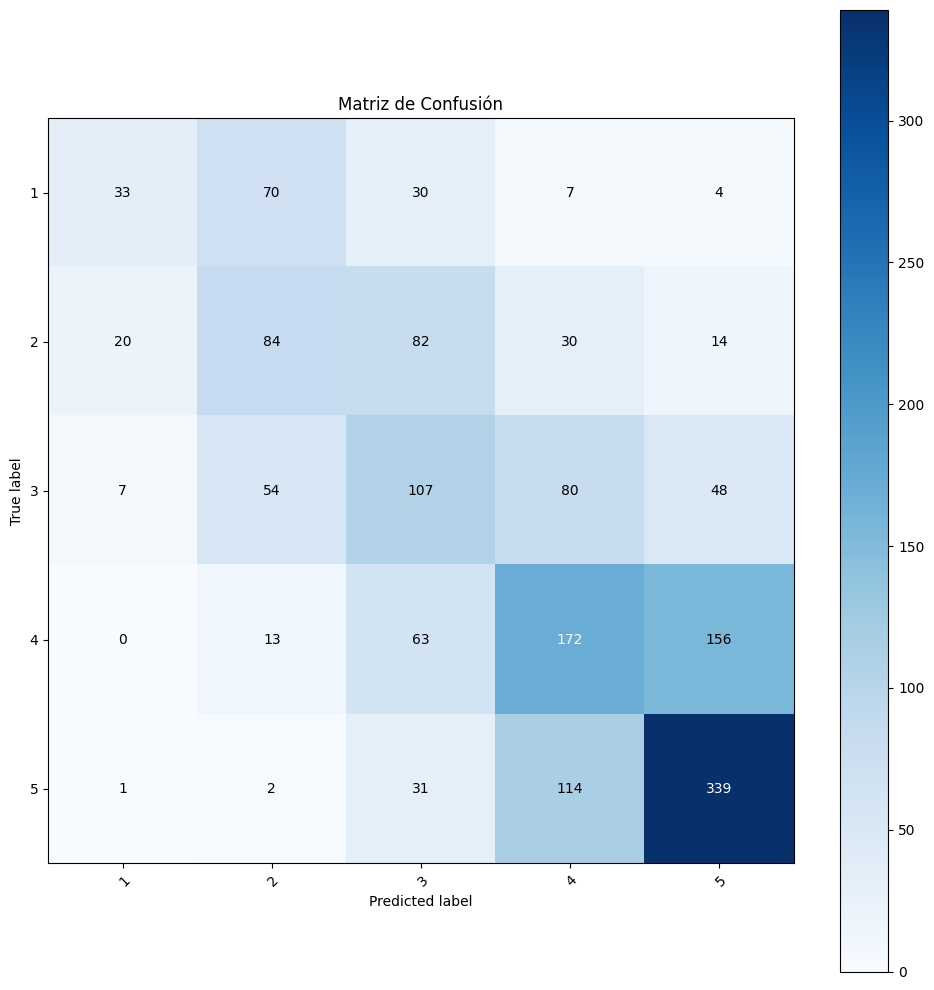

In [44]:
%matplotlib inline

classes = pipe_NB['classifier'].classes_

plot_confusion_matrix(y_true=y_test, y_pred=y_pred_test_NB, classes=classes,
                      title='Matriz de Confusión')

In [45]:
report_NB = classification_report(y_train, y_pred_train_NB)

print("Train Report for naive bayes multinomial\n", report_NB)

Train Report for naive bayes multinomial
               precision    recall  f1-score   support

           1       0.94      0.68      0.79       620
           2       0.77      0.74      0.75       936
           3       0.75      0.69      0.72      1261
           4       0.69      0.72      0.70      1556
           5       0.77      0.87      0.82      1868

    accuracy                           0.76      6241
   macro avg       0.78      0.74      0.76      6241
weighted avg       0.76      0.76      0.76      6241



In [46]:
report_NB_test = classification_report(y_test, y_pred_test_NB)

print("Train Report for naive bayes multinomial\n", report_NB_test)

Train Report for naive bayes multinomial
               precision    recall  f1-score   support

           1       0.54      0.23      0.32       144
           2       0.38      0.37      0.37       230
           3       0.34      0.36      0.35       296
           4       0.43      0.43      0.43       404
           5       0.60      0.70      0.65       487

    accuracy                           0.47      1561
   macro avg       0.46      0.42      0.42      1561
weighted avg       0.47      0.47      0.46      1561



In [47]:
precision = accuracy_score(y_train, y_pred_train_NB)

print("Precisión del modelo:", precision)

Precisión del modelo: 0.7582118250280404


In [48]:
precision = accuracy_score(y_test, y_pred_test_NB)

print("Precisión del modelo con test :", precision)

Precisión del modelo con test : 0.47085201793721976


###**4.3 Random Forest**

In [58]:
%%time
estimators = [
        ('preproccess',TextPreprocessing()),
        ('transform',CountVectorizer(lowercase=False)),
        #('transform',TfidfVectorizer()),
        #('transform',HashingVectorizer()),
        ('classifier', RandomForestRegressor())
        #('classifier', RandomForestClassifier(random_state=1))
    ]

pipe_RF = Pipeline(estimators)

pipe_RF.fit(X_train, y_train)

CPU times: user 2min 37s, sys: 222 ms, total: 2min 37s
Wall time: 2min 41s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', CountVectorizer(lowercase=False)),
                ('classifier', RandomForestRegressor())])

In [59]:
y_pred_train_RF = pipe_RF.predict(X_train)
y_pred_train_RF

array([4.9 , 4.94, 2.05, ..., 3.06, 3.4 , 3.76])

In [60]:
y_pred_test_RF = pipe_RF.predict(X_test)
y_pred_test_RF

array([4.88, 4.43, 4.47, ..., 4.11, 3.03, 4.66])

In [61]:
# Calcula el MSE (Mean Squared Error)
mse_train_RF = mean_squared_error(y_train, y_pred_train_RF)

# Calcula el MAE (Mean Absolute Error)
mae_train_RF = mean_absolute_error(y_train, y_pred_train_RF)

# Calcula el R cuadrado
r2_train_RF = r2_score(y_train, y_pred_train_RF)

print("Métricas de rendimiento en el conjunto de entrenamiento:")
print("Mean Squared Error (MSE):", mse_train_RF)
print("Mean Absolute Error (MAE):", mae_train_RF)
print("R-squared (R^2):", r2_train_RF)

Métricas de rendimiento en el conjunto de entrenamiento:
Mean Squared Error (MSE): 0.13095382150296425
Mean Absolute Error (MAE): 0.2793238263098862
R-squared (R^2): 0.9249389898699624


In [62]:
# Calcula el MSE (Mean Squared Error)
mse_test_RF = mean_squared_error(y_test, y_pred_test_RF)

# Calcula el MAE (Mean Absolute Error)
mae_test_RF = mean_absolute_error(y_test, y_pred_test_RF)

# Calcula el R cuadrado
r2_test_RF = r2_score(y_test, y_pred_test_RF)

print("Métricas de rendimiento en el conjunto de entrenamiento:")
print("Mean Squared Error (MSE):", mse_test_RF)
print("Mean Absolute Error (MAE):", mae_test_RF)
print("R-squared (R^2):", r2_test_RF)

Métricas de rendimiento en el conjunto de entrenamiento:
Mean Squared Error (MSE): 0.9906103139013454
Mean Absolute Error (MAE): 0.7810570147341447
R-squared (R^2): 0.4239095314410035


RandomForestClassifier

In [65]:
%%time
estimators = [
    ('preproccess',TextPreprocessing()),
    ('transform', TfidfVectorizer(lowercase=False)),
    ('classifier', RandomForestClassifier(random_state=3))
]

pipe_RF_classi = Pipeline(estimators)

pipe_RF_classi.fit(X_train, y_train)

CPU times: user 29.1 s, sys: 158 ms, total: 29.2 s
Wall time: 37.2 s


Pipeline(steps=[('preproccess', TextPreprocessing()),
                ('transform', TfidfVectorizer(lowercase=False)),
                ('classifier', RandomForestClassifier(random_state=3))])

In [71]:
# Prediciendo las etiquetas para el conjunto de prueba
y_pred_classi = pipe_RF_classi.predict(X_train)
precision_classifier = accuracy_score(y_train, y_pred_classi)
print("Precisión del modelo:", precision_classifier)

Precisión del modelo: 1.0


In [73]:
# Prediciendo las etiquetas para el conjunto de prueba
y_pred_classi = pipe_RF_classi.predict(X_test)
precision_classifier = accuracy_score(y_test, y_pred_classi)
print("Precisión del modelo:", precision_classifier)

Precisión del modelo: 0.45996156310057656


In [75]:
from sklearn.metrics import f1_score

In [76]:
# Calculando el F1 Score del modelo
f1_classifier = f1_score(y_test, y_pred_classi, average='weighted')
print("F1 Score del modelo:", f1_classifier)

F1 Score del modelo: 0.4368240640945578


Conclusiones

1. Como parte del proyecto se quiso examinar como seria el Overfitting o sobreajuste en cada uno de los modelos implementados, En el sobreajuste, el modelo se ajusta tan bien a los datos de entrenamiento que no es capaz de generalizar bien a nuevos datos no vistos.

Los resultados del sobreajuste dieron que los modelos que mas se sobreajustan son:


1.   RandomForestClassifier con un valor de 1.0
2.   SVM con un valor de 0.985
3.   RandomForestRegressor con un valor de 0.925
4.   naive bayes multinomial con un valor de 0.758





Por otra parte luego de examinar los modelos con los valores con los cuales no fue entrenados (test) generan las siguientes precisiones:

1.   naive bayes multinomial con valor de 0.4708
1.   randomForestClassifier con valor de 0.4599
2.   SVM con un valor de 0.4407
2.   RandomForestRegressor con un valor de 0.4239



Teniendo en cuenta que luego de entrenar los modelos para el negocio ninguno supero una precision mayor al 50%. **No** se le recomienda al negocio utilizar estos modelos de machine learning para predecir reviews acorde a las calificaciones para mejorar el turismo. Debido a que son menores al 50% se le recomienda al negocio mejorar los datos de entrada y de igual implementar modelos mas complejos o entrenar los modelos con mas datos.